In [1]:
# Libraries I'm going to use

import pandas as pd
import numpy as np
import matplotlib
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns


In [2]:
# import opendatasets as od
# od.download('https://www.kaggle.com/aitzaz/stack-overflow-developer-survey-2020')

In [3]:
df = pd.read_csv('.\stack-overflow-developer-survey-2020\developer_survey_2020\survey_results_public.csv')

In [4]:
df.head()

,Respondent,MainBranch,Hobbyist,Age,Age1stCode,CompFreq,CompTotal,ConvertedComp,Country,CurrencyDesc,...,SurveyEase,SurveyLength,Trans,UndergradMajor,WebframeDesireNextYear,WebframeWorkedWith,WelcomeChange,WorkWeekHrs,YearsCode,YearsCodePro
0,1,I am a developer by profession,Yes,NaN,13,Monthly,NaN,NaN,Germany,European Euro,...,Neither easy nor difficult,Appropriate in length,No,"Computer science, computer engineering, or sof...",ASP.NET Core,ASP.NET;ASP.NET Core,Just as welcome now as I felt last year,50.0,36,27
1,2,I am a developer by profession,No,NaN,19,NaN,NaN,NaN,United Kingdom,Pound sterling,...,NaN,NaN,NaN,"Computer science, computer engineering, or sof...",NaN,NaN,Somewhat more welcome now than last year,NaN,7,4
2,3,I code primarily as a hobby,Yes,NaN,15,NaN,NaN,NaN,Russian Federation,NaN,...,Neither easy nor difficult,Appropriate in length,NaN,NaN,NaN,NaN,Somewhat more welcome now than last year,NaN,4,NaN
3,4,I am a developer by profession,Yes,25.0,18,NaN,NaN,NaN,Albania,Albanian lek,...,NaN,NaN,No,"Computer science, computer engineering, or sof...",NaN,NaN,Somewhat less welcome now than last year,40.0,7,4
4,5,"I used to be a developer by profession, but no...",Yes,31.0,16,NaN,NaN,NaN,United States,NaN,...,Easy,Too short,No,"Computer science, computer engineering, or sof...",Django;Ruby on Rails,Ruby on Rails,Just as welcome now as I felt last year,NaN,15,8


In [5]:
df.shape

(64461, 61)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 64461 entries, 0 to 64460
Data columns (total 61 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Respondent                    64461 non-null  int64  
 1   MainBranch                    64162 non-null  object 
 2   Hobbyist                      64416 non-null  object 
 3   Age                           45446 non-null  float64
 4   Age1stCode                    57900 non-null  object 
 5   CompFreq                      40069 non-null  object 
 6   CompTotal                     34826 non-null  float64
 7   ConvertedComp                 34756 non-null  float64
 8   Country                       64072 non-null  object 
 9   CurrencyDesc                  45472 non-null  object 
 10  CurrencySymbol                45472 non-null  object 
 11  DatabaseDesireNextYear        44070 non-null  object 
 12  DatabaseWorkedWith            49537 non-null  object 
 13  D

In [7]:
pd.set_option('display.max_rows',None)
QuestionText = pd.read_csv('.\stack-overflow-developer-survey-2020\developer_survey_2020\survey_results_schema.csv',index_col='Column').QuestionText
QuestionText

Column
Respondent                      Randomized respondent ID number (not in order ...
MainBranch                      Which of the following options best describes ...
Hobbyist                                                  Do you code as a hobby?
Age                             What is your age (in years)? If you prefer not...
Age1stCode                      At what age did you write your first line of c...
CompFreq                         Is that compensation weekly, monthly, or yearly?
CompTotal                       What is your current total compensation (salar...
ConvertedComp                   Salary converted to annual USD salaries using ...
Country                                                        Where do you live?
CurrencyDesc                    Which currency do you use day-to-day? If your ...
CurrencySymbol                  Which currency do you use day-to-day? If your ...
DatabaseDesireNextYear          Which database environments have you done exte...
DatabaseW

These are questions of each column.

# Data Preparation & Cleaning

In [8]:
df1 = df.copy()

In [9]:
# As all the columns are written in mixed case letters,let's us transform this into same case i.e all lower or all upper.

df1.columns = df1.columns.str.lower()
df1.columns


Index(['respondent', 'mainbranch', 'hobbyist', 'age', 'age1stcode', 'compfreq',
       'comptotal', 'convertedcomp', 'country', 'currencydesc',
       'currencysymbol', 'databasedesirenextyear', 'databaseworkedwith',
       'devtype', 'edlevel', 'employment', 'ethnicity', 'gender', 'jobfactors',
       'jobsat', 'jobseek', 'languagedesirenextyear', 'languageworkedwith',
       'misctechdesirenextyear', 'misctechworkedwith',
       'newcollabtoolsdesirenextyear', 'newcollabtoolsworkedwith', 'newdevops',
       'newdevopsimpt', 'newedimpt', 'newjobhunt', 'newjobhuntresearch',
       'newlearn', 'newofftopic', 'newonboardgood', 'newothercomms',
       'newovertime', 'newpurchaseresearch', 'newpurplelink', 'newsosites',
       'newstuck', 'opsys', 'orgsize', 'platformdesirenextyear',
       'platformworkedwith', 'purchasewhat', 'sexuality', 'soaccount',
       'socomm', 'sopartfreq', 'sovisitfreq', 'surveyease', 'surveylength',
       'trans', 'undergradmajor', 'webframedesirenextyear',
  

In [10]:
selected_cols= [
    'country',
    'gender',
    'age',
    'edlevel',
    'undergradmajor',
    'hobbyist', 
    'age1stcode',
    'yearscode',
    'yearscodepro',
    'languageworkedwith',
    'languagedesirenextyear',
    'newlearn',
    'newstuck',
    'employment',
    'devtype',
    'workweekhrs',
    'jobfactors',
    'jobsat',
    'newovertime', 
    'newedimpt'                          
]

In [11]:
df2 = df1[selected_cols].copy()

In [12]:
df2.shape

(64461, 20)

In [13]:
df2.head()

,country,gender,age,edlevel,undergradmajor,hobbyist,age1stcode,yearscode,yearscodepro,languageworkedwith,languagedesirenextyear,newlearn,newstuck,employment,devtype,workweekhrs,jobfactors,jobsat,newovertime,newedimpt
0,Germany,Man,NaN,"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)","Computer science, computer engineering, or sof...",Yes,13,36,27,C#;HTML/CSS;JavaScript,C#;HTML/CSS;JavaScript,Once a year,Visit Stack Overflow;Go for a walk or other ph...,"Independent contractor, freelancer, or self-em...","Developer, desktop or enterprise applications;...",50.0,"Languages, frameworks, and other technologies ...",Slightly satisfied,Often: 1-2 days per week or more,Fairly important
1,United Kingdom,NaN,NaN,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)","Computer science, computer engineering, or sof...",No,19,7,4,JavaScript;Swift,Python;Swift,Once a year,Visit Stack Overflow;Go for a walk or other ph...,Employed full-time,"Developer, full-stack;Developer, mobile",NaN,NaN,Very dissatisfied,NaN,Fairly important
2,Russian Federation,NaN,NaN,NaN,NaN,Yes,15,4,NaN,Objective-C;Python;Swift,Objective-C;Python;Swift,Once a decade,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Albania,Man,25.0,"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)","Computer science, computer engineering, or sof...",Yes,18,7,4,NaN,NaN,Once a year,NaN,NaN,NaN,40.0,Flex time or a flexible schedule;Office enviro...,Slightly dissatisfied,Occasionally: 1-2 days per quarter but less th...,Not at all important/not necessary
4,United States,Man,31.0,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)","Computer science, computer engineering, or sof...",Yes,16,15,8,HTML/CSS;Ruby;SQL,Java;Ruby;Scala,Once a year,Call a coworker or friend;Visit Stack Overflow...,Employed full-time,NaN,NaN,NaN,NaN,NaN,Very important


In [14]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 64461 entries, 0 to 64460
Data columns (total 20 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   country                 64072 non-null  object 
 1   gender                  50557 non-null  object 
 2   age                     45446 non-null  float64
 3   edlevel                 57431 non-null  object 
 4   undergradmajor          50995 non-null  object 
 5   hobbyist                64416 non-null  object 
 6   age1stcode              57900 non-null  object 
 7   yearscode               57684 non-null  object 
 8   yearscodepro            46349 non-null  object 
 9   languageworkedwith      57378 non-null  object 
 10  languagedesirenextyear  54113 non-null  object 
 11  newlearn                56156 non-null  object 
 12  newstuck                54983 non-null  object 
 13  employment              63854 non-null  object 
 14  devtype                 49370 non-null

As we can see that age1stcode, yearscode, yearscodepro are "O" data type, we must need to convert them into numeric data type.       

In [15]:
df2['age1stcode'] = pd.to_numeric(df2.age1stcode,errors='coerce')
df2['yearscode'] = pd.to_numeric(df2['yearscode'],errors='coerce')
df2['yearscodepro'] = pd.to_numeric(df2['yearscodepro'],errors='coerce')

In [16]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 64461 entries, 0 to 64460
Data columns (total 20 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   country                 64072 non-null  object 
 1   gender                  50557 non-null  object 
 2   age                     45446 non-null  float64
 3   edlevel                 57431 non-null  object 
 4   undergradmajor          50995 non-null  object 
 5   hobbyist                64416 non-null  object 
 6   age1stcode              57473 non-null  float64
 7   yearscode               56784 non-null  float64
 8   yearscodepro            44133 non-null  float64
 9   languageworkedwith      57378 non-null  object 
 10  languagedesirenextyear  54113 non-null  object 
 11  newlearn                56156 non-null  object 
 12  newstuck                54983 non-null  object 
 13  employment              63854 non-null  object 
 14  devtype                 49370 non-null

In [17]:
df2.describe()

,age,age1stcode,yearscode,yearscodepro,workweekhrs
count,45446.000000,57473.000000,56784.000000,44133.000000,41151.000000
mean,30.834111,15.476572,12.782051,8.869667,40.782174
std,9.585392,5.114081,9.490657,7.759961,17.816383
min,1.000000,5.000000,1.000000,1.000000,1.000000
25%,24.000000,12.000000,6.000000,3.000000,40.000000
50%,29.000000,15.000000,10.000000,6.000000,40.000000
75%,35.000000,18.000000,17.000000,12.000000,44.000000
max,279.000000,85.000000,50.000000,50.000000,475.000000


from the above it's seen that in 'age' column min age is 1 and max is 279 which is quite unobvious. similarly, the max value for workweekhrs is 475 which is pretty high and for sure it's also unusual or unreal. So, I'll try to fix it somehow by taking an assupmtion for those.


In [18]:
df2.drop(df2[df2.age<10].index,inplace=True)
df2.drop(df2[df2.age > 100].index,inplace=True)
df2.drop(df2[df2.workweekhrs > 120].index,inplace=True)

In [19]:
df2.describe()

,age,age1stcode,yearscode,yearscodepro,workweekhrs
count,45308.000000,57311.000000,56623.000000,43979.000000,40987.000000
mean,30.831575,15.475476,12.784558,8.873371,39.989832
std,9.502678,5.115380,9.495155,7.762505,10.476611
min,10.000000,5.000000,1.000000,1.000000,1.000000
25%,24.000000,12.000000,6.000000,3.000000,40.000000
50%,29.000000,15.000000,10.000000,6.000000,40.000000
75%,35.000000,18.000000,17.000000,12.000000,43.000000
max,99.000000,85.000000,50.000000,50.000000,120.000000


Okay! So, now it's pretty obvious and seems realistic.

In [20]:
df2.gender.value_counts()

Man                                                            45883
Woman                                                           3835
Non-binary, genderqueer, or gender non-conforming                385
Man;Non-binary, genderqueer, or gender non-conforming            121
Woman;Non-binary, genderqueer, or gender non-conforming           92
Woman;Man                                                         73
Woman;Man;Non-binary, genderqueer, or gender non-conforming       25
Name: gender, dtype: int64

Here, we can see that a few people chose multiple values which is kinda gibberish, so let's fix it.

In [21]:
df2['gender'] = df2['gender'].replace(r';', np.NaN, regex=True)

In [22]:
df2.gender.value_counts()

Man                                                  45883
Woman                                                 3835
Non-binary, genderqueer, or gender non-conforming      385
Name: gender, dtype: int64

In [23]:
df2.head(10)

,country,gender,age,edlevel,undergradmajor,hobbyist,age1stcode,yearscode,yearscodepro,languageworkedwith,languagedesirenextyear,newlearn,newstuck,employment,devtype,workweekhrs,jobfactors,jobsat,newovertime,newedimpt
0,Germany,Man,NaN,"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)","Computer science, computer engineering, or sof...",Yes,13.0,36.0,27.0,C#;HTML/CSS;JavaScript,C#;HTML/CSS;JavaScript,Once a year,Visit Stack Overflow;Go for a walk or other ph...,"Independent contractor, freelancer, or self-em...","Developer, desktop or enterprise applications;...",50.0,"Languages, frameworks, and other technologies ...",Slightly satisfied,Often: 1-2 days per week or more,Fairly important
1,United Kingdom,NaN,NaN,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)","Computer science, computer engineering, or sof...",No,19.0,7.0,4.0,JavaScript;Swift,Python;Swift,Once a year,Visit Stack Overflow;Go for a walk or other ph...,Employed full-time,"Developer, full-stack;Developer, mobile",NaN,NaN,Very dissatisfied,NaN,Fairly important
2,Russian Federation,NaN,NaN,NaN,NaN,Yes,15.0,4.0,NaN,Objective-C;Python;Swift,Objective-C;Python;Swift,Once a decade,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Albania,Man,25.0,"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)","Computer science, computer engineering, or sof...",Yes,18.0,7.0,4.0,NaN,NaN,Once a year,NaN,NaN,NaN,40.0,Flex time or a flexible schedule;Office enviro...,Slightly dissatisfied,Occasionally: 1-2 days per quarter but less th...,Not at all important/not necessary
4,United States,Man,31.0,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)","Computer science, computer engineering, or sof...",Yes,16.0,15.0,8.0,HTML/CSS;Ruby;SQL,Java;Ruby;Scala,Once a year,Call a coworker or friend;Visit Stack Overflow...,Employed full-time,NaN,NaN,NaN,NaN,NaN,Very important
5,Germany,Man,NaN,"Secondary school (e.g. American high school, G...",NaN,No,14.0,6.0,4.0,HTML/CSS;Java;JavaScript,HTML/CSS;Java;JavaScript,Once a year,Play games;Visit Stack Overflow;Watch help / t...,Employed full-time,"Designer;Developer, front-end;Developer, mobile",NaN,Diversity of the company or organization;Langu...,Slightly satisfied,Never,Fairly important
6,India,NaN,NaN,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)","Computer science, computer engineering, or sof...",Yes,18.0,6.0,4.0,C#;HTML/CSS;PHP,C#;HTML/CSS;PHP,Every few months,NaN,Employed full-time,"Developer, back-end;Developer, front-end;Devel...",NaN,NaN,Very satisfied,Sometimes: 1-2 days per month but less than we...,Very important
7,United States,Man,36.0,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)","Computer science, computer engineering, or sof...",Yes,12.0,17.0,13.0,Python;SQL,JavaScript,Once a year,Play games;Call a coworker or friend;Visit Sta...,Employed full-time,"Developer, back-end;Developer, desktop or ente...",39.0,Remote work options;Opportunities for professi...,Slightly dissatisfied,Occasionally: 1-2 days per quarter but less th...,Not at all important/not necessary
8,Tunisia,Man,30.0,"Professional degree (JD, MD, etc.)","Computer science, computer engineering, or sof...",No,20.0,6.0,4.0,HTML/CSS;JavaScript;PHP,Python;Rust,Once a year,Meditate,"Independent contractor, freelancer, or self-em...","Developer, full-stack",50.0,Diversity of the company or organization;Remot...,Very dissatisfied,Occasionally: 1-2 days per quarter but less th...,Very important
9,United Kingdom,Man,22.0,"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)",Mathematics or statistics,Yes,14.0,8.0,4.0,HTML/CSS;Java;JavaScript;Python;SQL,HTML/CSS;Java;JavaScript;Python;R;SQL,Every few months,Visit Stack Overflow,Employed full-time,"Database administrator;Developer, full-stack;D...",36.0,Flex time or a flexible schedule;How widely us...,Very satisfied,Often: 1-2 days per week or more,Fairly important


# Exploratory Analysis and Visualization

In [24]:
top_15_country = df2['country'].value_counts().sort_values(ascending=False).head(15)
top_15_country

United States         12467
India                  8391
United Kingdom         3894
Germany                3879
Canada                 2189
France                 1893
Brazil                 1811
Netherlands            1340
Poland                 1263
Australia              1208
Spain                  1160
Italy                  1114
Russian Federation     1090
Sweden                  883
Pakistan                808
Name: country, dtype: int64

In [25]:
import matplotlib.style
import matplotlib as mpl
mpl.style.available

['Solarize_Light2',
 '_classic_test_patch',
 'bmh',
 'classic',
 'dark_background',
 'fast',
 'fivethirtyeight',
 'ggplot',
 'grayscale',
 'seaborn',
 'seaborn-bright',
 'seaborn-colorblind',
 'seaborn-dark',
 'seaborn-dark-palette',
 'seaborn-darkgrid',
 'seaborn-deep',
 'seaborn-muted',
 'seaborn-notebook',
 'seaborn-paper',
 'seaborn-pastel',
 'seaborn-poster',
 'seaborn-talk',
 'seaborn-ticks',
 'seaborn-white',
 'seaborn-whitegrid',
 'tableau-colorblind10']

Text(0, 0.5, 'Country')

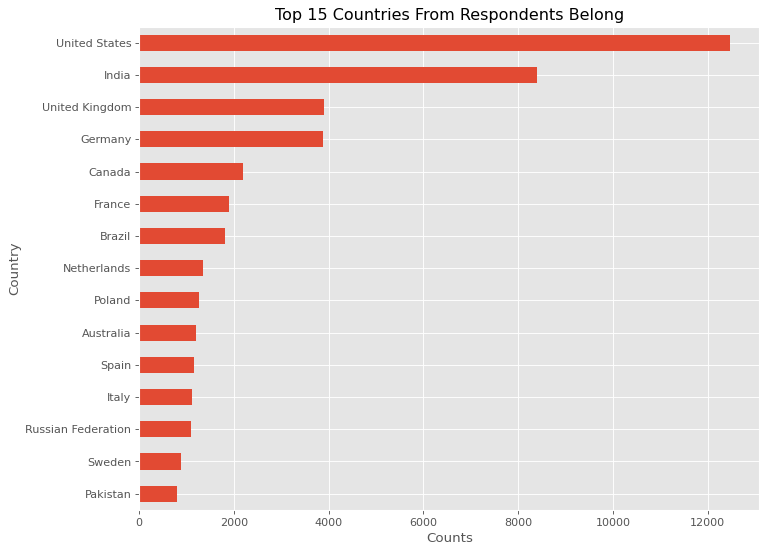

In [26]:

mpl.style.use('ggplot')

plt.figure(figsize=(10, 8), dpi=80)
top_15_country.sort_values().plot(kind='barh')
plt.title('Top 15 Countries From Respondents Belong')
plt.xlabel('Counts')
plt.ylabel('Country')

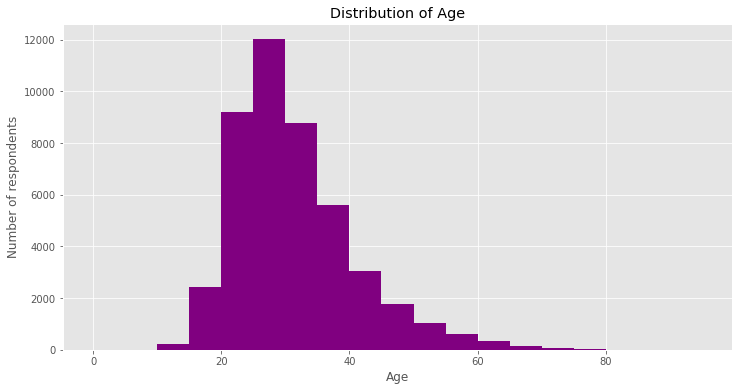

In [27]:
plt.figure(figsize=(12, 6))
plt.title('Distribution of Age')
plt.xlabel('Age')
plt.ylabel('Number of respondents')

plt.hist(df2.age, bins=range(0,int(df2.age.max()),5),  color='purple');

##### Exercise: You may want to filter out responses by age (or age group) if you'd like to analyze and compare the survey results for different age groups. Create a new column called AgeGroup containing values like Less than 10 years, 10-18 years, 18-30 years, 30-45 years, 45-60 years and Older than 60 years. Then, repeat the analysis in the rest of this notebook for each age group.

In [28]:
# Crating a new column Age Group based on respondents age

bins= [0,10,19,31,46,61,120]
labels = ['<10 ','10-18', '18-30', '30-45', '45-60','>60']
df2['AgeGroup'] = pd.cut(df2['age'], bins=bins, labels=labels, right=False)

df2[['age','AgeGroup']]



,age,AgeGroup
0,NaN,NaN
1,NaN,NaN
2,NaN,NaN
3,25.0,18-30
4,31.0,30-45
5,NaN,NaN
6,NaN,NaN
7,36.0,30-45
8,30.0,18-30
9,22.0,18-30


In [29]:
df2.AgeGroup.value_counts().sort_values()

<10          0
>60        514
10-18     1833
45-60     3043
30-45    15495
18-30    24423
Name: AgeGroup, dtype: int64

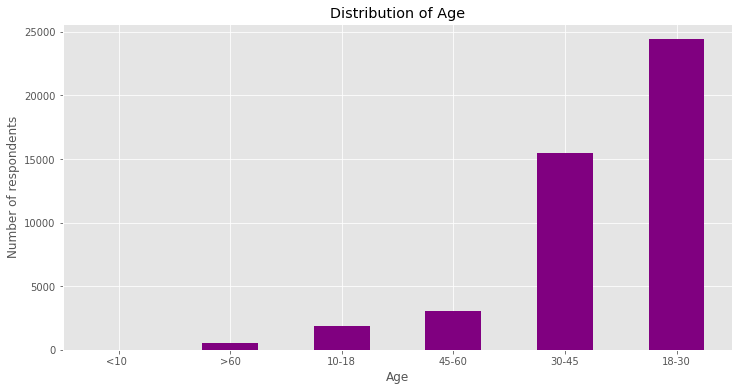

In [30]:
# AgeGroup distribution

plt.figure(figsize=(12, 6))
df2.AgeGroup.value_counts().sort_values().plot(kind='bar',color='purple')
plt.title('Distribution of Age')
plt.xlabel('Age')
plt.ylabel('Number of respondents')
plt.xticks(rotation=0);


It appears that a large percentage of respondents are 20-45 years old. It's somewhat representative of the programming community in general. Many young people have taken up computer science as their field of study or profession in the last 20 years.

In [31]:
#Gender

df2.gender.value_counts()


Man                                                  45883
Woman                                                 3835
Non-binary, genderqueer, or gender non-conforming      385
Name: gender, dtype: int64

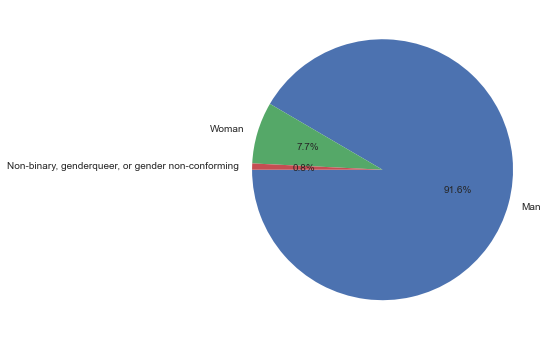

In [32]:

mpl.style.use('seaborn')
plt.figure(figsize=(12,6))
plt.pie(df2.gender.value_counts(),labels = df2.gender.value_counts().index, autopct='%1.1f%%',startangle=180);

Only about 8% of survey respondents who have answered the question identify as women or non-binary. This number is lower than the overall percentage of women & non-binary genders in the programming community - which is estimated to be around 12%.

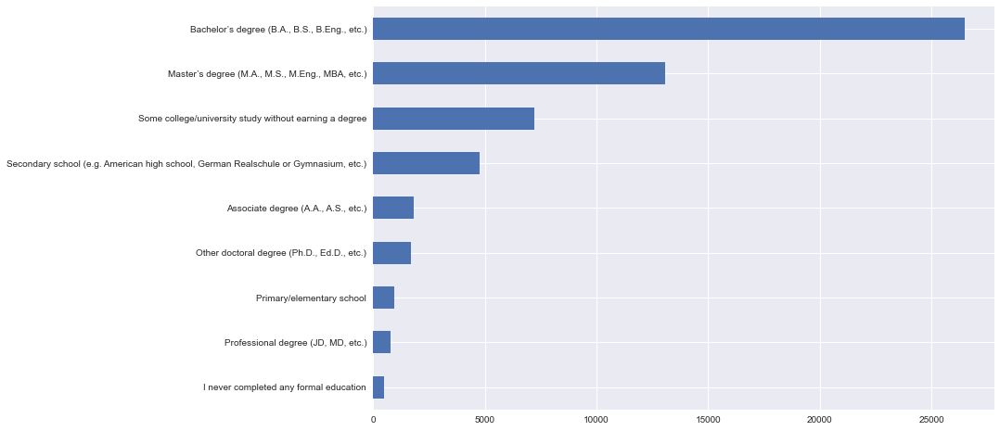

In [33]:
# Education Level

mpl.style.use('seaborn')
plt.figure(figsize=(12,8))
df2.edlevel.value_counts().sort_values(ascending=True).plot(kind='barh');

Exercises: The graph currently shows the number of respondents for each option. Can you modify it to show the percentage instead? Further, try comparing the percentages for each degree for men vs. women.

In [34]:
edlevel_percentage = df2.edlevel.value_counts() / df2.edlevel.value_counts().sum() *100

In [35]:
edlevel_percentage

Bachelor’s degree (B.A., B.S., B.Eng., etc.)                                          46.233499
Master’s degree (M.A., M.S., M.Eng., MBA, etc.)                                       22.820773
Some college/university study without earning a degree                                12.602151
Secondary school (e.g. American high school, German Realschule or Gymnasium, etc.)     8.303066
Associate degree (A.A., A.S., etc.)                                                    3.211217
Other doctoral degree (Ph.D., Ed.D., etc.)                                             2.947545
Primary/elementary school                                                              1.636167
Professional degree (JD, MD, etc.)                                                     1.395195
I never completed any formal education                                                 0.850388
Name: edlevel, dtype: float64

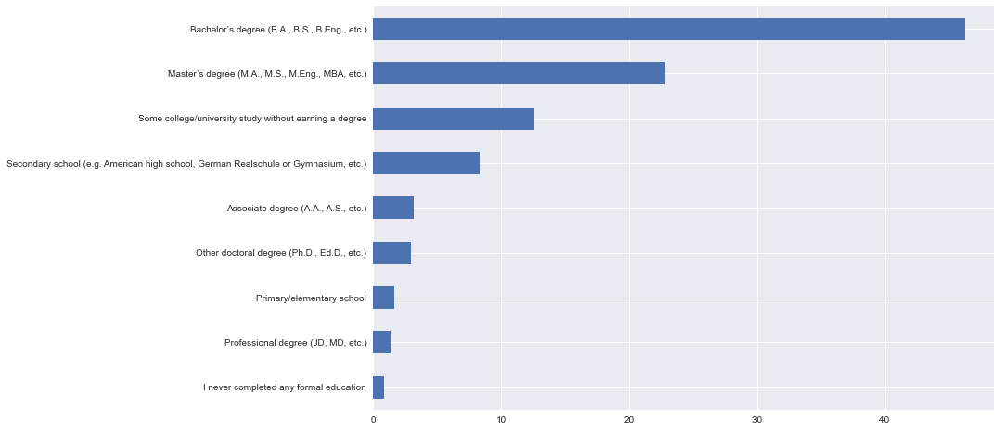

In [36]:
mpl.style.use('seaborn')
plt.figure(figsize=(12,8))
(df2.edlevel.value_counts() / df2.edlevel.value_counts().sum() *100).sort_values(ascending=True).plot(kind='barh');

In [37]:
df3 = df2[['edlevel','gender']]

In [38]:
pd.crosstab(df3.gender,df3.edlevel).apply(lambda x: x/sum(x)*100,axis=1)

edlevel,"Associate degree (A.A., A.S., etc.)","Bachelor’s degree (B.A., B.S., B.Eng., etc.)",I never completed any formal education,"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)","Other doctoral degree (Ph.D., Ed.D., etc.)",Primary/elementary school,"Professional degree (JD, MD, etc.)","Secondary school (e.g. American high school, German Realschule or Gymnasium, etc.)",Some college/university study without earning a degree
gender,,,,,,,,,
Man,3.304146,45.647573,0.661720,22.656685,2.889736,1.702204,1.365773,8.687031,13.085132
"Non-binary, genderqueer, or gender non-conforming",3.773585,37.466307,2.156334,18.598383,3.504043,1.617251,0.808625,13.477089,18.598383
Woman,2.705599,51.540316,0.428610,25.287972,3.991428,0.562550,1.071524,5.625502,8.786499


From above, it's clear that among the all education level around 45% man, 51% woman have completed their B.Sc.

<Figure size 864x576 with 0 Axes>

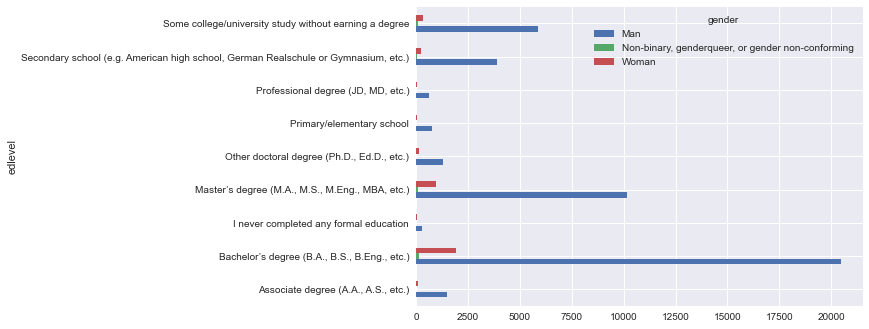

In [39]:
plt.figure(figsize=(12,8))
pd.crosstab(df3.edlevel,df3.gender).plot.barh();

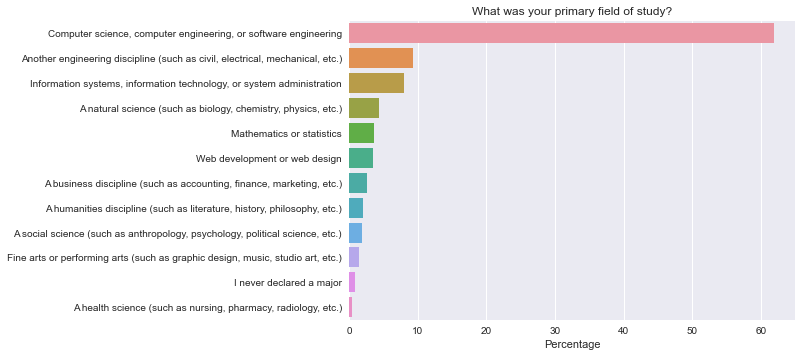

In [40]:
#Undergrad Major

undergrad_pct = df2.undergradmajor.value_counts() * 100 / df2.undergradmajor.count()

sns.barplot(x=undergrad_pct, y=undergrad_pct.index)

plt.title(QuestionText.UndergradMajor)
plt.ylabel(None);
plt.xlabel('Percentage');

It turns out that 40% of programmers holding a college degree have a field of study other than computer science - which is very encouraging. It seems to suggest that while a college education is helpful in general, you do not need to pursue a major in computer science to become a successful programmer.

In [41]:
# Employment

employment_pct = df2.employment.value_counts()*100/ df2.employment.value_counts().sum()
employment_pct

Employed full-time                                      70.869121
Student                                                 12.224229
Independent contractor, freelancer, or self-employed     8.863940
Not employed, but looking for work                       3.679045
Employed part-time                                       3.476486
Not employed, and not looking for work                   0.505614
Retired                                                  0.381566
Name: employment, dtype: float64

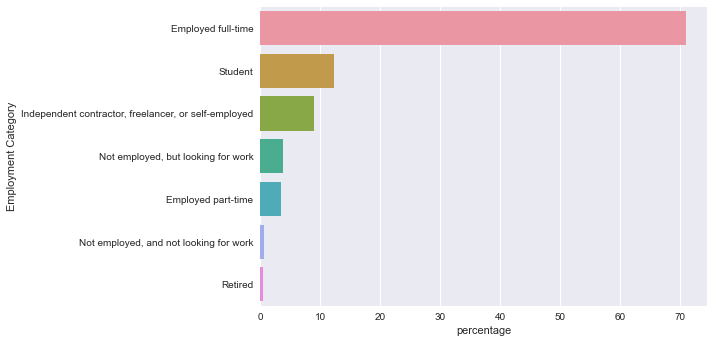

In [42]:
sns.barplot(x= employment_pct.values,y = employment_pct.index)
plt.ylabel('Employment Category')
plt.xlabel('percentage')
plt.xticks(rotation=0);

We can see that, over 70% are full time employed and also it appears that close to 10% of respondents are employed part time or as freelancers.

In [43]:
# Let's look into devtype (Developer Type)

print(df2['devtype'].unique())

df2['devtype'].value_counts()

['Developer, desktop or enterprise applications;Developer, full-stack'
 'Developer, full-stack;Developer, mobile' nan ...
 'Data scientist or machine learning specialist;Database administrator;Developer, back-end;Developer, front-end;System administrator'
 'Academic researcher;Data or business analyst;Data scientist or machine learning specialist;Database administrator;Designer;Developer, back-end;Developer, desktop or enterprise applications;Developer, embedded applications or devices;Developer, front-end;Developer, full-stack;Developer, game or graphics;Developer, mobile;Developer, QA or test;DevOps specialist;Senior executive/VP;System administrator'
 'Data or business analyst;Developer, mobile;Senior executive/VP;System administrator']


Developer, full-stack                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                  4415
Developer, back-end                                                                                                                                                                                                                                                                                                                                                                                                                                                         

It's kinda gibberish. Here, we can see some are 'Developer, desktop or enterprise applications;Developer, full-stack' where as a portion is 'Developer, full-stack;Developer, mobile' etc which is somehow typical to understand the actual count of a particular Developer type.

So,let's make a function so that we can look into this easily and get some insights.

In [53]:
def split_multicolumn(col_series):
    result_df = col_series.to_frame()
    options = []
    # Iterate over the column
    for idx, value  in col_series[col_series.notnull()].iteritems():
        # Break each value into list of options
        for option in value.split(';'):
            # Add the option as a column to result
            if not option in result_df.columns:
                options.append(option)
                result_df[option] = False
            # Mark the value in the option column as True
            result_df.at[idx, option] = True
    return result_df[options]



In [57]:
dev_type_df = split_multicolumn(df2.devtype)
dev_type_pct = dev_type_df.mean().sort_values(ascending=False)*100
dev_type_pct

Developer, back-end                              42.195642
Developer, full-stack                            42.054098
Developer, front-end                             28.347669
Developer, desktop or enterprise applications    18.259165
Developer, mobile                                14.686348
DevOps specialist                                 9.247017
Database administrator                            8.856605
Designer                                          8.246877
System administrator                              8.114666
Developer, embedded applications or devices       7.352507
Data or business analyst                          6.229488
Data scientist or machine learning specialist     6.178159
Developer, QA or test                             6.103498
Engineer, data                                    5.797079
Academic researcher                               5.495326
Educator                                          4.532516
Developer, game or graphics                       4.3209

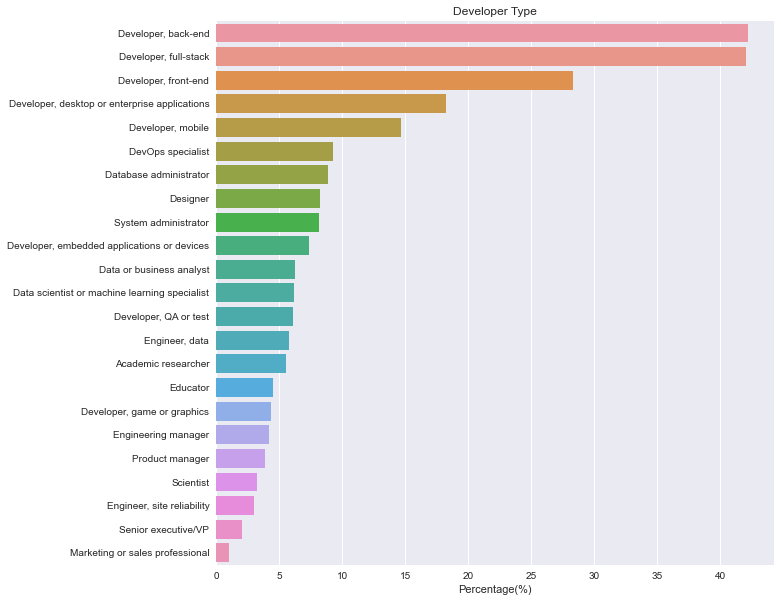

In [59]:
plt.figure(figsize=(10, 10))
sns.barplot(x=dev_type_pct, y=dev_type_pct.index)
plt.title("Developer Type");
plt.xlabel('Percentage(%)');

Here, it is clearly observed that there are around around 45% are Back-end and full-stack developer respectively.Also,the portion of Data/Business analyst and designes are pretty impactive.


In [65]:
countries_df = df2.groupby('country')['workweekhrs'].mean().sort_values(ascending=False)
countries_df

country
Kuwait                                       58.222222
Grenada                                      50.000000
Iraq                                         49.071429
Maldives                                     47.300000
Afghanistan                                  46.500000
United Republic of Tanzania                  46.000000
Jordan                                       45.806452
Djibouti                                     45.000000
Tajikistan                                   45.000000
Saint Vincent and the Grenadines             45.000000
Niger                                        45.000000
Liechtenstein                                45.000000
Lebanon                                      44.372093
Cambodia                                     44.000000
Albania                                      43.962963
Iran                                         43.944079
Israel                                       43.687943
Mauritius                                    43.181818
La

In [69]:
top_15_country_wwh = countries_df.loc[df2.country.value_counts() > 250 ].head(10)
top_15_country_wwh

country
Iran             43.944079
Israel           43.687943
China            42.134752
United States    41.781602
Greece           41.402724
South Africa     41.023460
Turkey           40.785078
Sri Lanka        40.612245
Viet Nam         40.563025
New Zealand      40.526721
Name: workweekhrs, dtype: float64

In [70]:
# How important is it to start young to build a career in programming?

df2.columns

Index(['country', 'gender', 'age', 'edlevel', 'undergradmajor', 'hobbyist',
       'age1stcode', 'yearscode', 'yearscodepro', 'languageworkedwith',
       'languagedesirenextyear', 'newlearn', 'newstuck', 'employment',
       'devtype', 'workweekhrs', 'jobfactors', 'jobsat', 'newovertime',
       'newedimpt', 'AgeGroup'],
      dtype='object')

C:\Users\A S U S\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


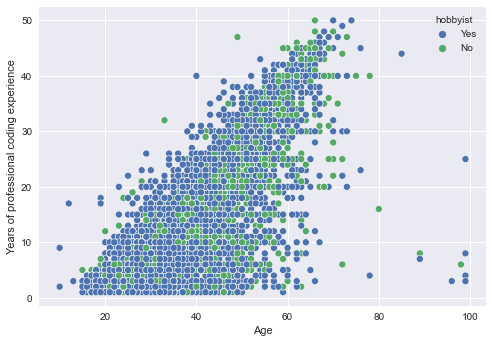

In [80]:
sns.scatterplot('age','yearscodepro',hue='hobbyist',data=df2);
plt.xlabel("Age")
plt.ylabel("Years of professional coding experience");

You can see points all over the graph, which indicates that you can start programming professionally at any age. Many people who have been coding for several decades professionally also seem to enjoy it as a hobby.

# Inferences

We've observed many inferences from the dataset. Here's a summary of a few of them:

1. Based on the survey respondents' , we can claim that the survey is somewhat representative of the overall programming community. However, it has fewer responses from programmers in non-English-speaking countries and women & non-binary genders.

2. The programming community is not as diverse as it can be. Although things are improving, we should give efforts and take some essential steps to encourage communities, whether in terms of age, country, gender, or otherwise.

3. Although most programmers hold a college degree, a reasonably large percentage did not have computer science as their college major. Hence, a computer science degree isn't compulsory for learning to code or building a career in programming.

4. There are around around 45% are Back-end and full-stack developer respectively.Also,the portion of Data/Business analyst and designes are pretty impactive.

5. Programmers worldwide seem to be working for around 40 hours a week on average, with slight variations by country.

6. You can learn and start programming professionally at any age. You're likely to have a long and fulfilling career if you also enjoy programming as a hobby.